# Latest Mark 6

In [91]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from copy import deepcopy

In [92]:
def read_files(ddir):
    images = dict()
    ACCEPTED_FORMAT = ['jpg', 'png']
    for d in sorted(os.listdir(ddir)):
        if d.split('.')[1].lower() in ACCEPTED_FORMAT:
            fname = d.split('.')[0]
            print(f'reading {os.path.join(ddir, d)}...')
            images[fname] = cv2.imread(os.path.join(ddir, d))
            images[fname] = cv2.cvtColor(images[fname], cv2.COLOR_BGR2RGB)
    return images

def display_all(imgs, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def display_all_with(imgs, cc, subs=(10,10), fgsz=(15,18), use_gray=True):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k][:,:,cc], cmap='gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
            
def save_plots(imgs, suptitle, savedir, subs=(10,10), fgsz=(15,18), use_gray=False):
    fig, axs = plt.subplots(subs[0], subs[1], figsize=fgsz)
    k = 0
    for i in range(subs[0]):
        for j in range(subs[1]):
            axs[i, j].imshow(list(imgs.values())[k], 'gray' if use_gray else None)
            axs[i, j].set_title(list(imgs.keys())[k])
            axs[i, j].axis('off')
            k+=1
    fig.suptitle(suptitle)
    fig.savefig(savedir)
    print(f'Figure is successfully saved at {savedir}')

def adjust_gamma(image, gamma=1.0):
    table = np.array([((i / 255.0) ** gamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)

In [93]:
POSITIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive'
NEGATIVE = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/negative'
IDEAL = r'/home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/drishtiGS_069.png'

In [94]:
## Read Images

In [95]:
pos = read_files(POSITIVE)
ideal = cv2.imread(IDEAL)
ideal = cv2.cvtColor(ideal, cv2.COLOR_BGR2RGB)

reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/036.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/069.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/158.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/159.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/160.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/228.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/229.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/245.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/247.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/273.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/277.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/289.jpg...
reading /home/tsdhrm/Pictures/thesis/dataset/100DataNew/positive/293.jpg...
reading /hom

In [96]:
## Histogram Matching

In [97]:
from skimage.exposure import match_histograms

In [98]:
pos_matched = {}
for p in pos:
    pos_matched[p] = match_histograms(pos[p], ideal, multichannel=True)

/tmp/ipykernel_17007/3255611397.py:3: FutureWarning: `multichannel` is a deprecated argument name for `match_histograms`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pos_matched[p] = match_histograms(pos[p], ideal, multichannel=True)


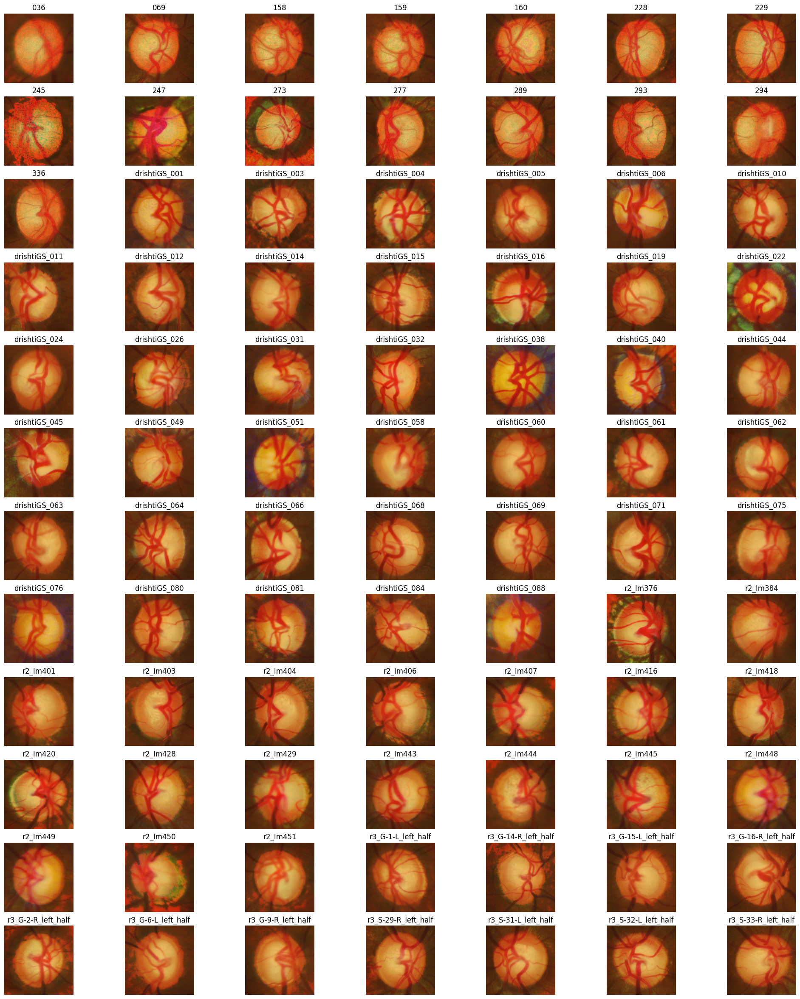

In [99]:
display_all(pos_matched, (12,7), (25,30))

In [100]:
## Optic Disc Segmentation

In [101]:
def get_which_ellipse(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    ellipse = cv2.fitEllipse(contours[cont_idx])
    return ellipse

def set_bleeds(img, trim_border=15):
    '''
    A bleed is a small area around the edge of 
    your artwork that extends beyond the “finished” 
    cut edge of your document.
    '''
    img[:, :trim_border] = 0
    img[:trim_border, :] = 0
    img[-trim_border:, :] = 0
    img[:, -trim_border:] = 0
    
    return img

def extract_od(matched):
    od_line = {}
    ods = {}
    
    okernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25,25))
    ekernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15,15))
    
    for img in matched:
        red = matched[img][:,:,0]
        gmc = adjust_gamma(red, 3)
        blurred = cv2.medianBlur(gmc, 25)
        opened = cv2.morphologyEx(blurred, cv2.MORPH_OPEN, okernel)
        eroded = cv2.morphologyEx(opened, cv2.MORPH_ERODE, ekernel)
        ret2, th2 = cv2.threshold(eroded,0,255,
                                  cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        binaries = set_bleeds(th2, 55)
        cont, hcy = cv2.findContours(binaries, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        ellipse = get_which_ellipse(cont)
        od = np.zeros_like(th2, dtype='uint8')
        cv2.ellipse(od, ellipse, (255, 255, 255), -1)
        ods[img] = od
        od_line[img] = ellipse
    
    print('done!')
    return od_line, ods

In [102]:
pm = deepcopy(pos_matched)
ps = deepcopy(pos)
od_lines, all_od = extract_od(pm)

done!


## Draw Function

In [103]:
def draw_od_line(imgs, roi_line, color):
    odlines = {}
    for img in imgs:
        odlines[img] = cv2.ellipse(imgs[img], 
                                   roi_line[img], 
                                   color, 
                                   3, 
                                   cv2.LINE_AA)
    return odlines

def draw_oc_line(imgs, roi_line, color):
    drawn_oc = {}
    
    for img in imgs:
        drawn_oc[img] = cv2.circle(imgs[img],roi_line[img][0],roi_line[img][1],color, 3)
    return drawn_oc

In [104]:
d_od = draw_od_line(ps, od_lines, (0, 255,0))

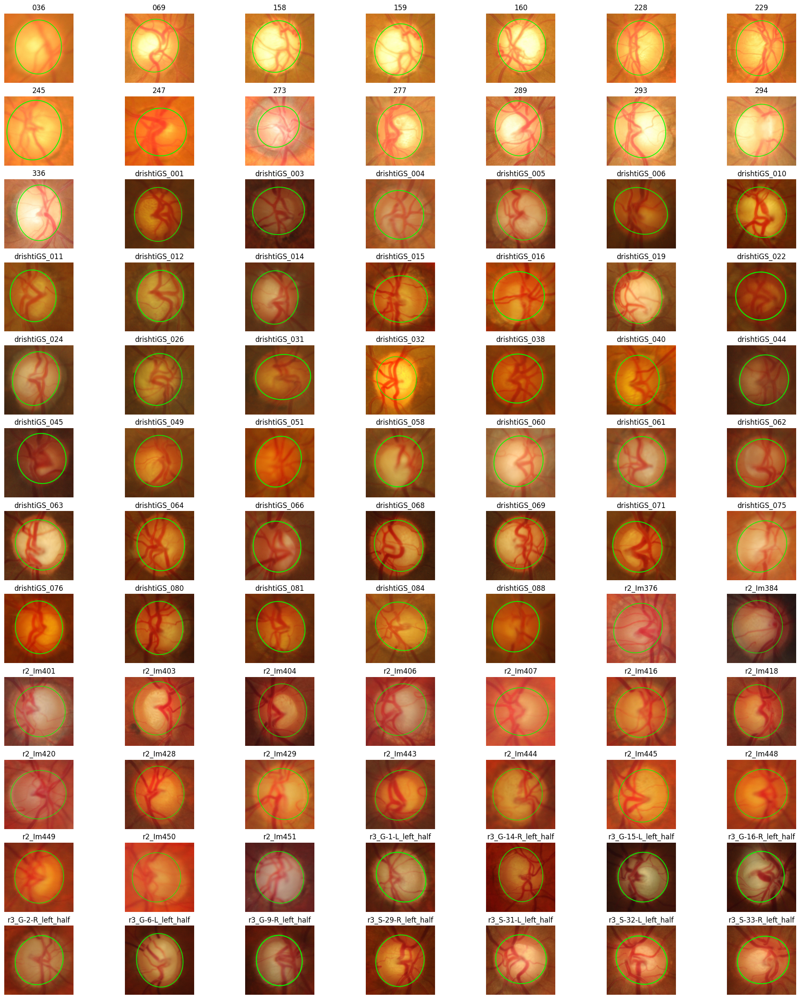

In [105]:
display_all(d_od, (12,7), (25,30))

## Optic Cup Segmentation

In [106]:
def get_circle(contours):
    conts = np.array([contour.shape[0] for contour in contours])
    cont_idx = np.argmax(conts)
    (x,y), radius = cv2.minEnclosingCircle(contours[cont_idx])
    return (x,y), radius

def select_boundaries(bnrs):
    cont, hcy = cv2.findContours(bnrs, 
                                     cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    (x,y),radius = get_circle(cont)
    center = (int(x),int(y))
    radius = int(radius)
    return (center, radius)

def extract_oc(imgs):
    p = {}
    oc_lines = {}
    ocs = {}
    close_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (55,55))
    
    for img in imgs:
        green = imgs[img][:,:,1]
        gaussianblur = cv2.GaussianBlur(green, (15,15), 0)
        gmc = adjust_gamma(gaussianblur, 6)
        ret3, th3 = cv2.threshold(
            gmc,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        binaries = cv2.morphologyEx(th3, cv2.MORPH_CLOSE, close_kernel)
        eroded = cv2.erode(binaries, kernel=np.ones((15,15), np.uint8))
        center_rad = select_boundaries(eroded)
        oc_lines[img] = center_rad
        canvas = np.zeros_like(th3, dtype='uint8')
        ocs[img] = cv2.circle(canvas, center_rad[0], center_rad[1], (255, 255, 255), -1)
    print('success!')
    return oc_lines, ocs

In [107]:
oc_lines, all_oc = extract_oc(pos_matched)

success!


In [108]:
dod = deepcopy(d_od)

In [109]:
d_oc = draw_oc_line(dod, oc_lines, (0, 0, 255))

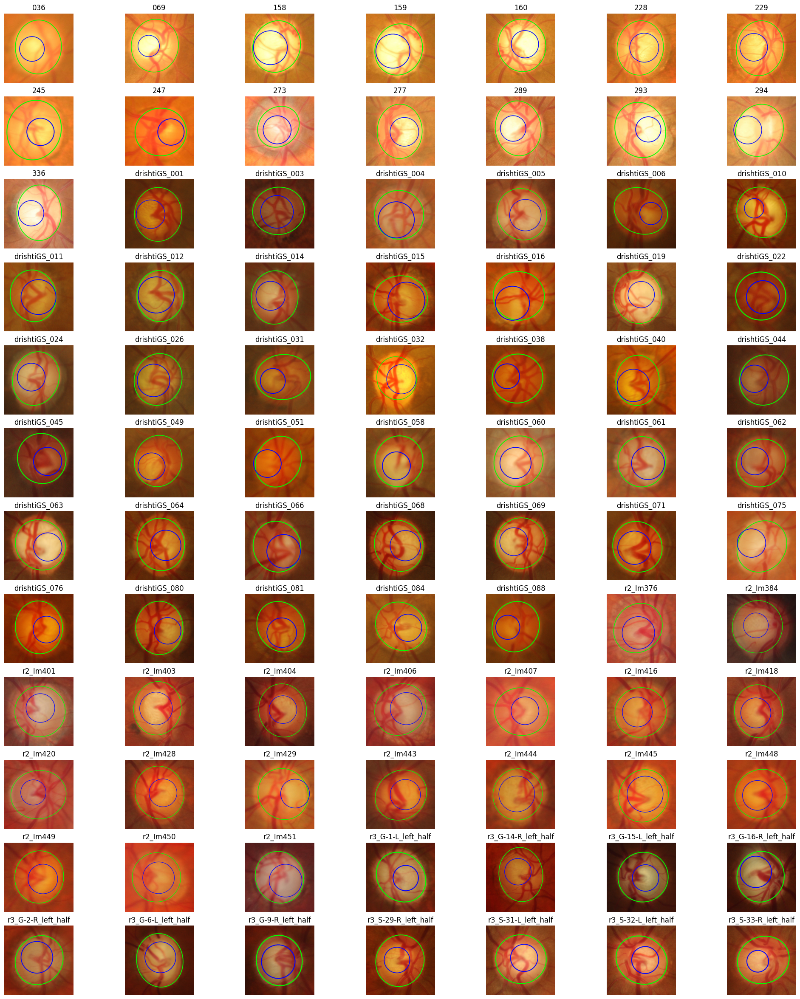

In [110]:
display_all(d_oc, (12,7), (25,30))

Figure is successfully saved at /home/tsdhrm/Desktop/ODOC.png


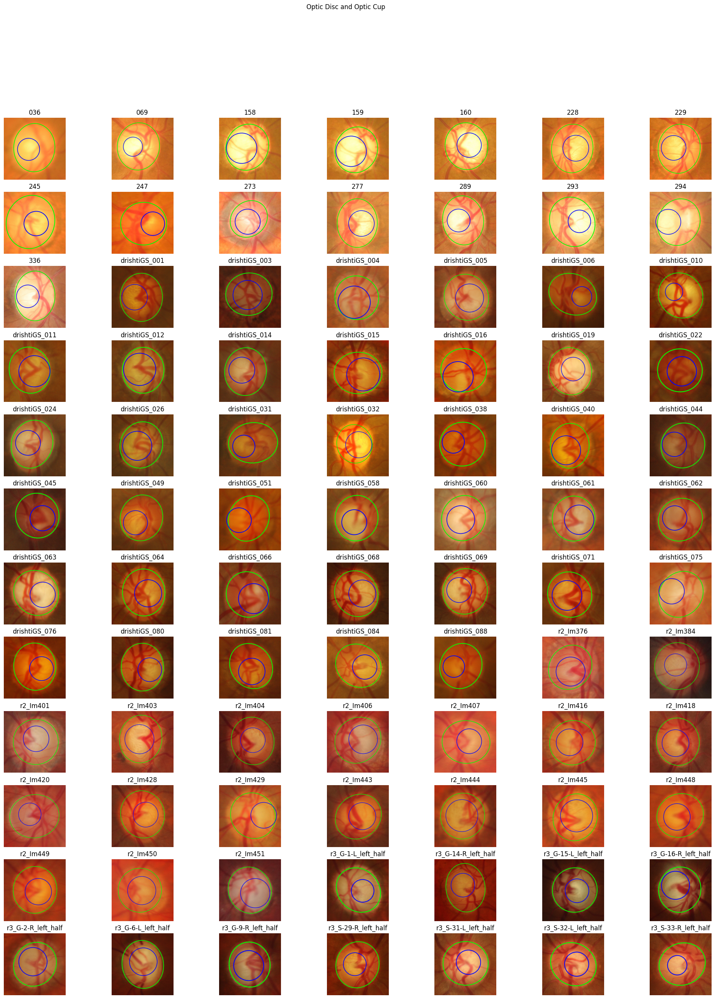

In [112]:
save_plots(d_oc, 'Optic Disc and Optic Cup', '/home/tsdhrm/Desktop/ODOC.png', (12,7), (25,30), False)

## Features Extraction